In [2]:
import copy
import random
import numpy as np
import pandas as pd

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import font_manager, rc

from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.svm import SVR

from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, RobustScaler, StandardScaler

font_name = font_manager.FontProperties(fname="c:/Windows/Fonts/malgun.ttf").get_name()
rc('font', family=font_name)    
matplotlib.rcParams['axes.unicode_minus'] = False      
pd.set_option('display.float_format', '{:.2f}'.format)
pd.set_option('display.max_columns', 150)

from xgboost import XGBRegressor

import torch 
import torch.nn as nn 
import torch.optim as optim 
from torch.autograd import Variable
from torch.utils.data import Dataset, DataLoader
torch.set_printoptions(sci_mode=False)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu") # device

random_seed = 616

### 기본 데이터

In [3]:
y_col = '유입량'
PK_col = ['홍수사상번호','연','월','일','시간']

In [4]:
data_raw = pd.read_excel('../data/01_제공데이터/2021 빅콘테스트_데이터분석분야_퓨처스리그_홍수ZERO_댐유입량,강우,수위데이터_210803.xlsx', header=[0,1])
data_raw = data_raw.dropna()

data_raw.columns = ['_'.join(col).strip() if "Unnamed" not in col[1] else col[0] for col in data_raw.columns.values]

In [5]:
# 결과 값 저장할 dataframe 생성

predict_df = pd.DataFrame()
predict_df[PK_col] = data_raw[PK_col]
predict_df['true'] = data_raw.유입량

rmse_df = pd.DataFrame()

## source code

In [6]:
class DNN(nn.Module):
    def __init__(self, input_size, hidden_layer=(1, 1, 1), batch_norm=True, drop_out=True, drop_prob=0.3):
        super().__init__()
        self.hidden_layer = self.make_layers(input_size, hidden_layer, batch_norm, drop_out, drop_prob)

    def forward(self, x):
        out = self.hidden_layer(x)
        return out

    def make_layers(self, input_size, hidden_layer, batch_norm, drop_out, drop_prob):
        layers = []
        in_size = input_size
        if hidden_layer[0] == 'R':
            for v in hidden_layer[1:]:
                out_size = int(v)
                linear = nn.Linear(in_size, out_size)
                torch.nn.init.xavier_uniform_(linear.weight)
                layers += [linear]

                if batch_norm:
                    layers += [nn.BatchNorm1d(out_size)]

                if drop_out:
                    layers += [torch.nn.Dropout(p=drop_prob)]

                layers += [nn.ReLU(inplace=True)]

                in_size = out_size
        else:
            for v in hidden_layer:
                out_size = int(input_size * v)
                linear = nn.Linear(in_size, out_size)
                torch.nn.init.xavier_uniform_(linear.weight)
                layers += [linear]

                if batch_norm:
                    layers += [nn.BatchNorm1d(out_size)]

                if drop_out:
                    layers += [torch.nn.Dropout(p=drop_prob)]

                layers += [nn.ReLU(inplace=True)]

                in_size = out_size

        linear = nn.Linear(out_size, 1)
        torch.nn.init.xavier_uniform_(linear.weight)
        layers += [linear]

        return nn.Sequential(*layers)

In [7]:
models = {"XGB" : XGBRegressor(), 
          "LR" : LinearRegression(),
          "DT" : DecisionTreeRegressor(random_state = random_seed),
          "SGDRegressor" : SGDRegressor(),
          "KernelRidge" : KernelRidge(),
          "SVR" : SVR()
         }

standard_scaler = StandardScaler()

In [8]:
first_values = data_raw.groupby('홍수사상번호').first()['유입량']

def model_predict(name, models, data, scaler, predict_df, rmse, option = 'None'):
    for model_name, model, in models.items():
        print(f"{model_name} Start!")
        pred_values = []
        for num in data.홍수사상번호.unique():
            train = data[data['홍수사상번호'] != num].dropna().copy()
            valid = data[data['홍수사상번호'] == num].copy()

            X_train = scaler.fit_transform(train.drop(columns=[y_col]+PK_col))
            y_train = train[y_col]

            X_valid = valid.drop(columns=[y_col]+PK_col)
            y_valid = valid[y_col]
        
            model.fit(X_train, y_train)

            if option == 'change':
                pred_valid = model.predict((scaler.transform(X_valid))[1:])
                pred_values.append(first_values[num])
                for value in pred_valid:
                    pred_values.append(pred_values[-1] + value)
                    
            elif option == 'shift_y':
                pred_values.append(first_values[num])
                X_valid.iloc[1, -1] = first_values[num]

                for i in range(1, len(X_valid)):
                    pred_valid = model.predict(scaler.transform(X_valid.iloc[[i]]))
                    pred_values += list(pred_valid)
                    try:
                        X_valid.iloc[i+1, -1] = pred_valid
                    except:
                        pass
                    
            elif option == 'shift':
                pred_values.append(first_values[num])
                pred_valid = model.predict((scaler.transform(X_valid))[1:])
                pred_values += list(pred_valid)
                    
            else:
                pred_valid = model.predict(scaler.transform(X_valid))
                pred_values += list(pred_valid)

        predict_df[f'pred_{model_name}_{name}'] = pred_values
        predict_df[f'error_{model_name}_{name}'] = abs(predict_df['true'] - predict_df[f'pred_{model_name}_{name}'])
        predict_df[f'error_percent_{model_name}_{name}'] = predict_df[f'error_{model_name}_{name}'] / predict_df['true'] * 100

        rmse = np.sqrt(mean_squared_error(predict_df['true'], predict_df[f'pred_{model_name}_{name}']))
        rmse_df.loc[name, model_name] = rmse

In [9]:
def plot_hongsunum(predict_df, models, name):
    for idx in predict_df['홍수사상번호'].unique():
        plt.figure(figsize=(12,4))
        predict_df.loc[predict_df['홍수사상번호'] ==idx]['true'].plot(label='True')
        for model_name in models.keys():
            predict_df.loc[predict_df['홍수사상번호'] ==idx][f'pred_{model_name}_{name}'].plot(label=model_name)
        plt.legend()
        plt.title(f"{name}_{idx}")
        plt.show()

# Predict

In [10]:
name = 'base'
data_base = data_raw.copy()

In [11]:
model_predict(name, models, data_base, standard_scaler, predict_df, rmse_df)

XGB Start!
LR Start!
DT Start!
SGDRegressor Start!
KernelRidge Start!
SVR Start!


In [12]:
rmse_df

,XGB,LR,DT,SGDRegressor,KernelRidge,SVR
base,984.90,914.04,1122.25,969.83,2020.16,2124.38


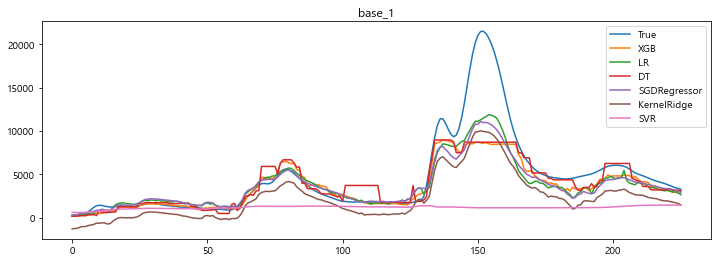

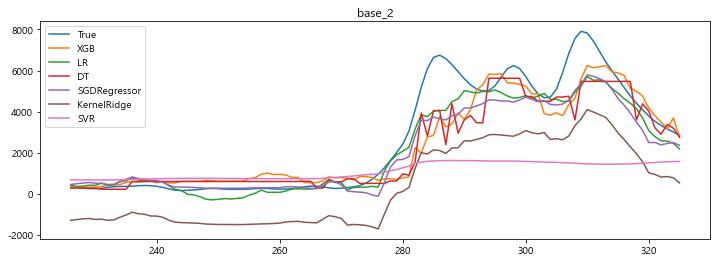

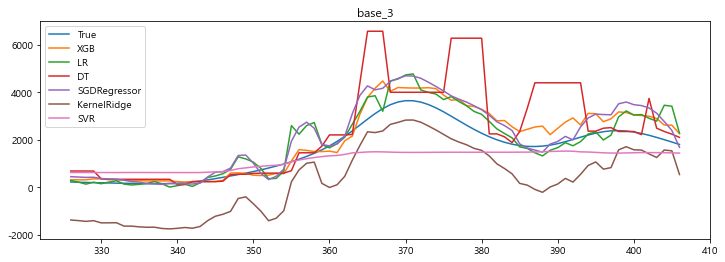

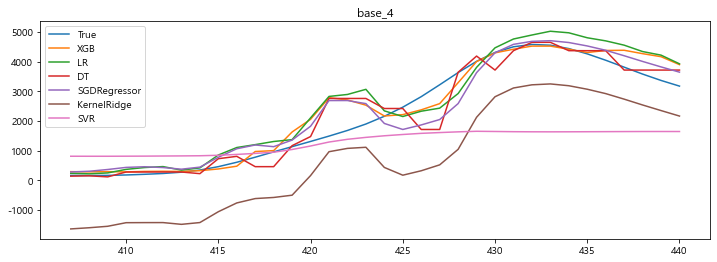

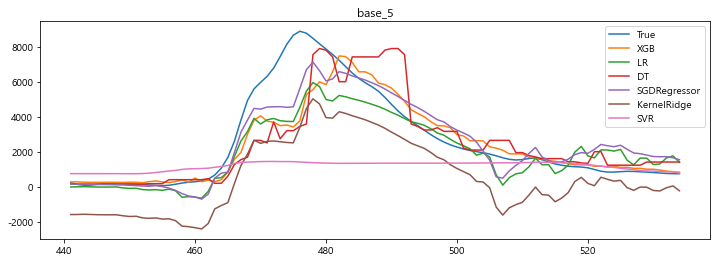

...

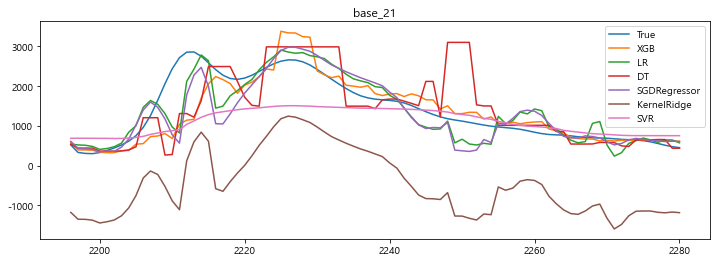

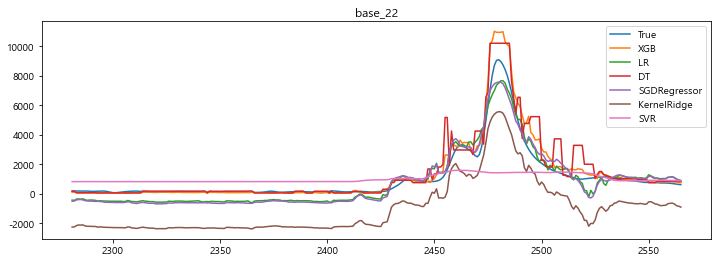

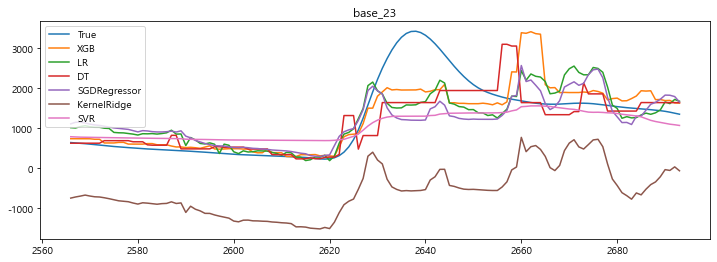

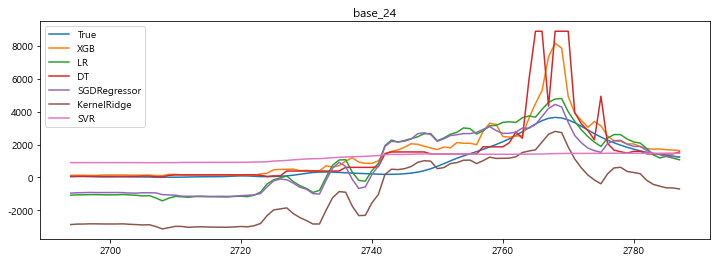

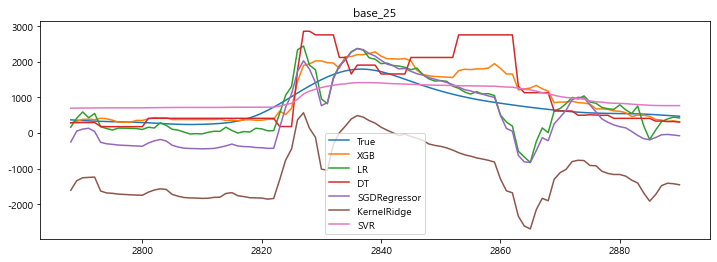

In [13]:
plot_hongsunum(predict_df, models, name)

# Predict_log

### log 데이터

In [16]:
name = 'log'    
data_log = data_raw.copy()

log_col = data_log.columns.difference(list(data_log.filter(regex="수위\(D지역\)").columns) + [y_col] + PK_col)
for col in log_col:
    data_log[col] = data_log[col].apply(lambda x : np.log(x - data_log[col].min() + 0.01))

In [17]:
model_predict(name, models, data_log, standard_scaler, predict_df, rmse_df)

XGB Start!
LR Start!
DT Start!
SGDRegressor Start!
KernelRidge Start!
SVR Start!


In [18]:
rmse_df

,XGB,LR,DT,SGDRegressor,KernelRidge,SVR
base,984.90,914.04,1122.25,969.83,2020.16,2124.38
log,985.69,1788.41,1120.20,2116.00,2765.48,2141.09


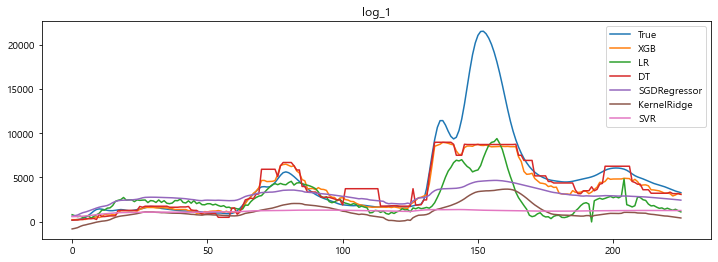

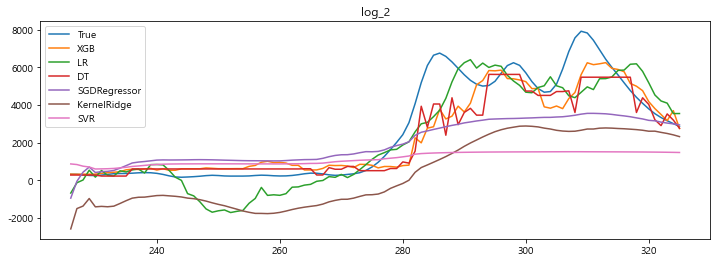

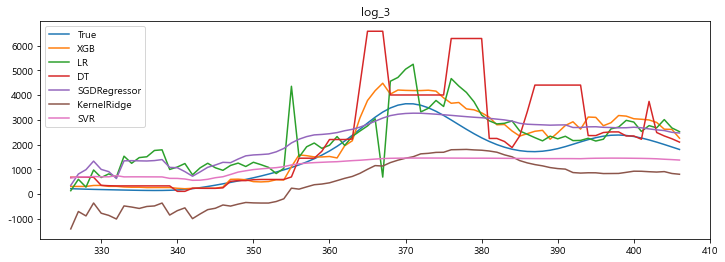

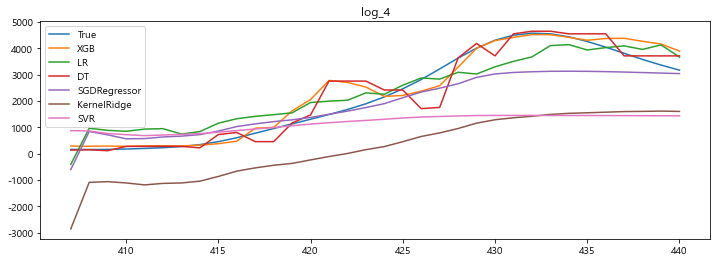

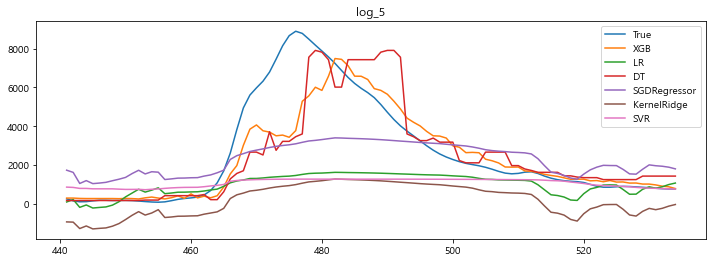

...

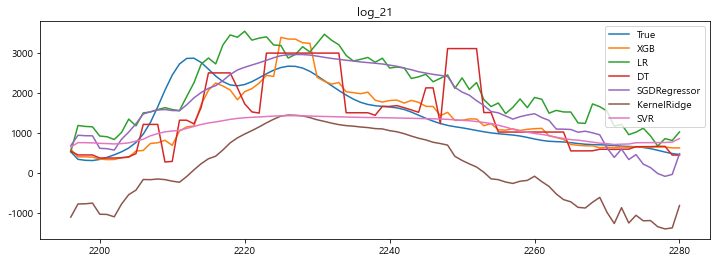

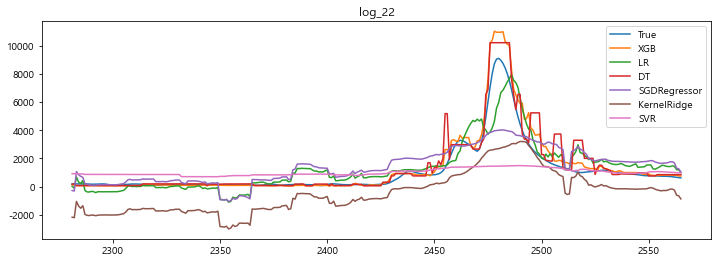

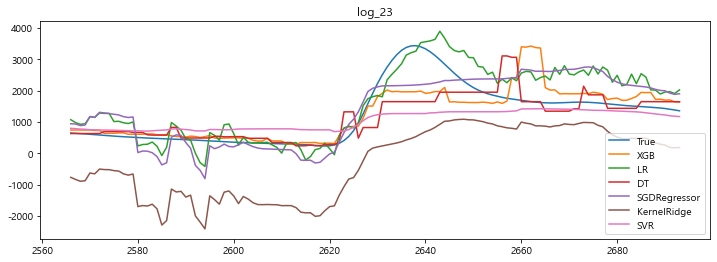

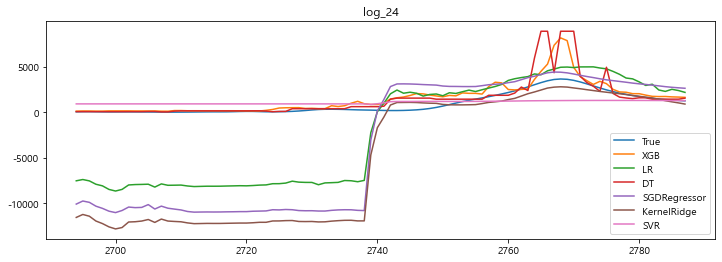

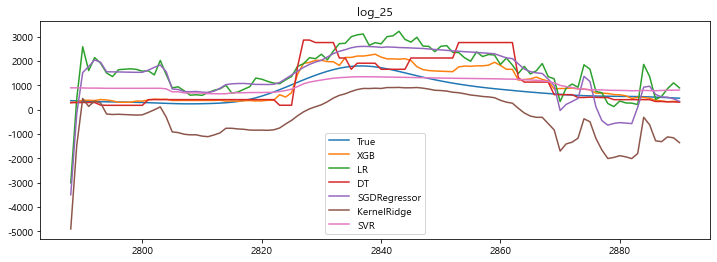

In [19]:
plot_hongsunum(predict_df, models, name)

# Predict_change

### change 데이터

In [22]:
name = 'change'
    
PK_df = data_raw[PK_col].copy()

data_change = pd.DataFrame()
for num in data_raw.홍수사상번호.unique():
    data_num = data_raw[data_raw.홍수사상번호 == num]
    data_change = data_change.append(data_num - data_num.shift())
    
data_change[PK_col] = PK_df

In [23]:
model_predict(name, models, data_change, standard_scaler, predict_df, rmse_df, option="change")

XGB Start!
LR Start!
DT Start!
SGDRegressor Start!
KernelRidge Start!
SVR Start!


In [24]:
rmse_df

,XGB,LR,DT,SGDRegressor,KernelRidge,SVR
base,984.90,914.04,1122.25,969.83,2020.16,2124.38
log,985.69,1788.41,1120.20,2116.00,2765.48,2141.09
change,2212.18,1580.48,2175.15,1850.44,1866.78,2896.56


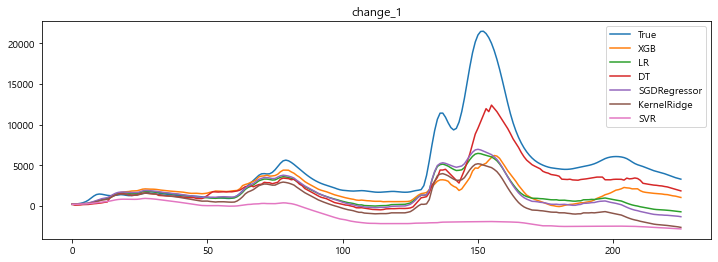

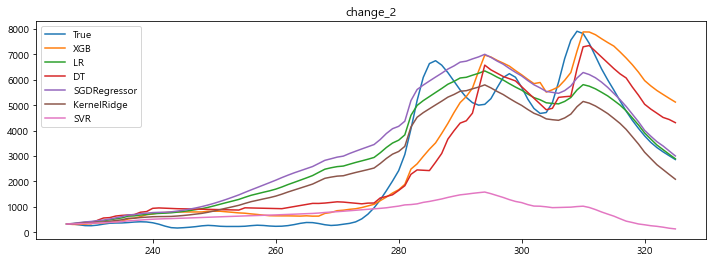

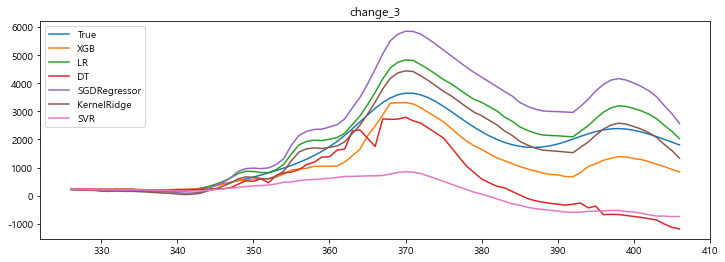

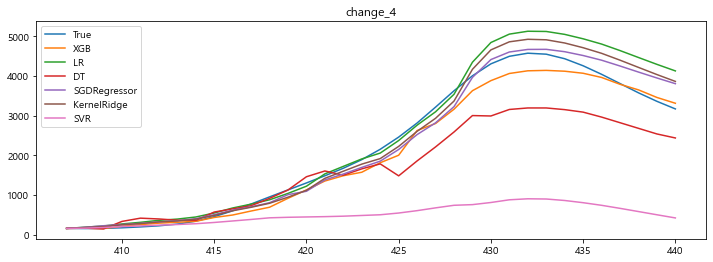

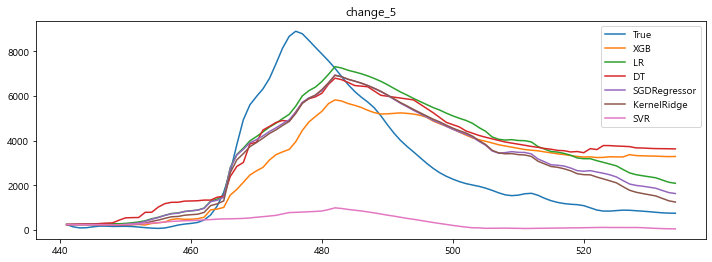

...

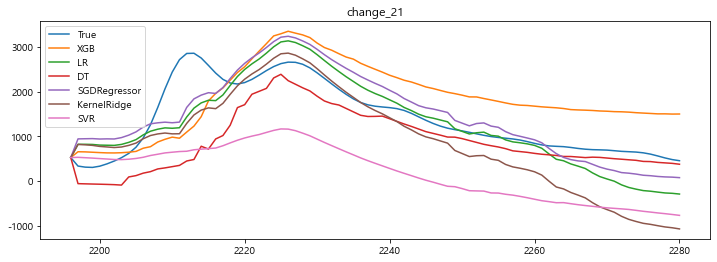

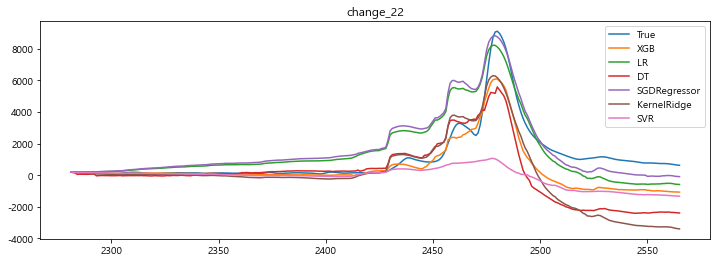

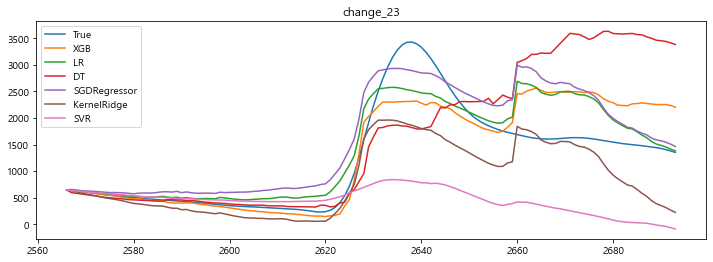

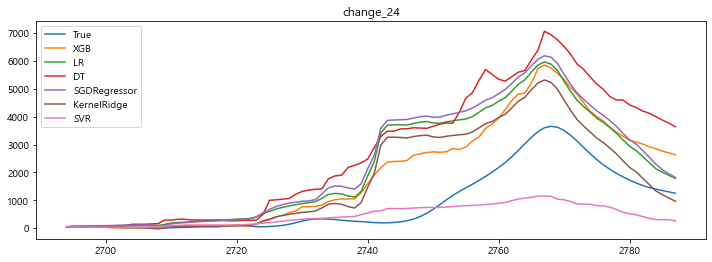

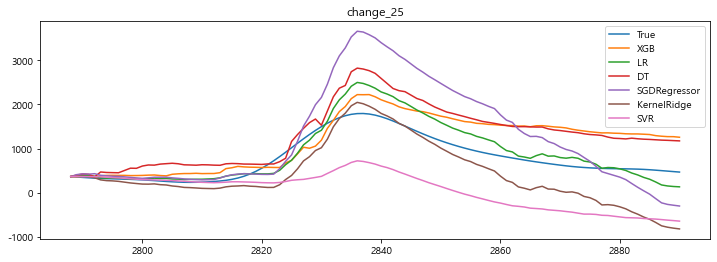

In [25]:
plot_hongsunum(predict_df, models, name)

## 데이터집단 평균 사용

In [26]:
name = 'mean'
    
data_one = pd.read_excel('../data/01_제공데이터/2021 빅콘테스트_데이터분석분야_퓨처스리그_홍수ZERO_댐유입량,강우,수위데이터_210803.xlsx', header=[0,1])
data_one = data_one.dropna()
data_one.columns = [col[1] if "Unnamed" not in col[1] else col[0] for col in data_one.columns.values]
data_one = data_one.groupby(by=data_one.columns, axis=1).mean()

In [27]:
model_predict(name, models, data_one, standard_scaler, predict_df, rmse_df)

XGB Start!
LR Start!
DT Start!
SGDRegressor Start!
KernelRidge Start!
SVR Start!


In [28]:
rmse_df

,XGB,LR,DT,SGDRegressor,KernelRidge,SVR
base,984.90,914.04,1122.25,969.83,2020.16,2124.38
log,985.69,1788.41,1120.20,2116.00,2765.48,2141.09
change,2212.18,1580.48,2175.15,1850.44,1866.78,2896.56
mean,1068.83,1104.97,1206.28,1098.66,2102.52,2122.82


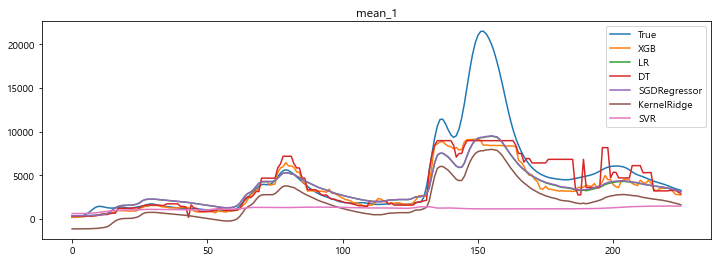

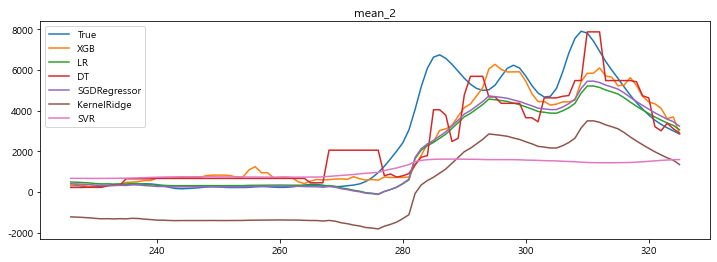

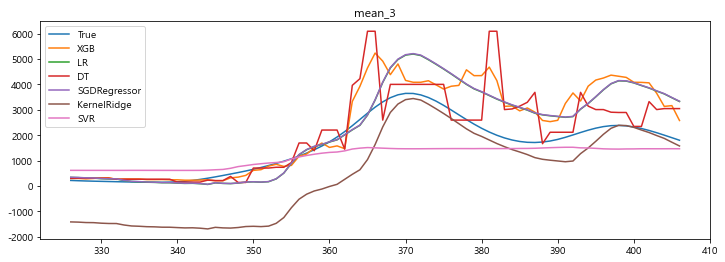

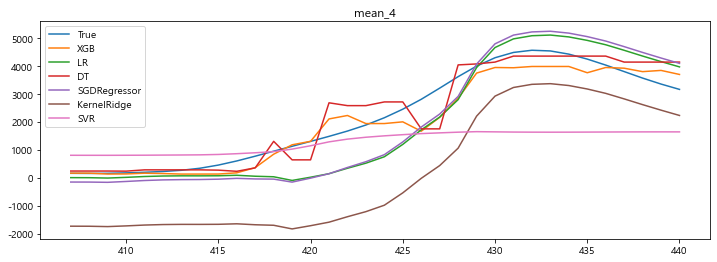

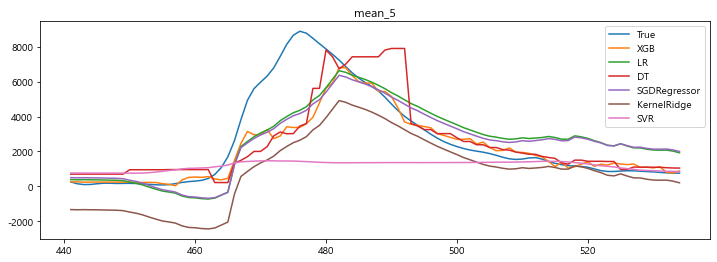

...

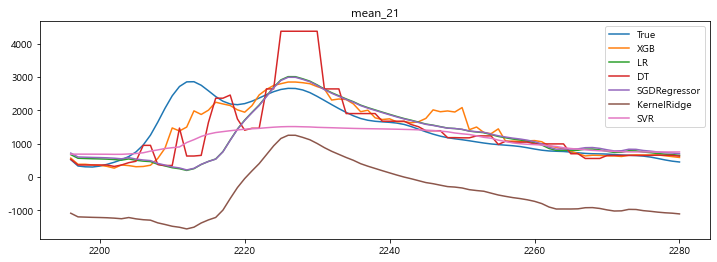

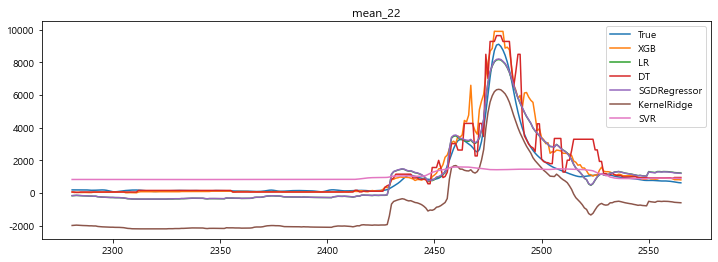

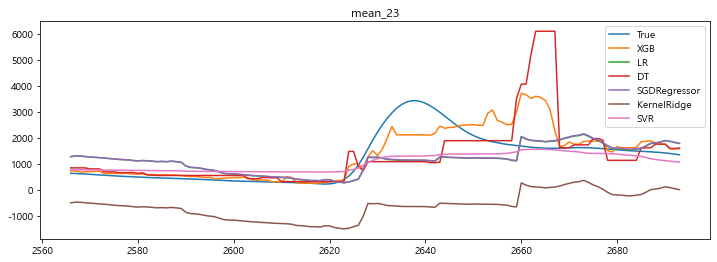

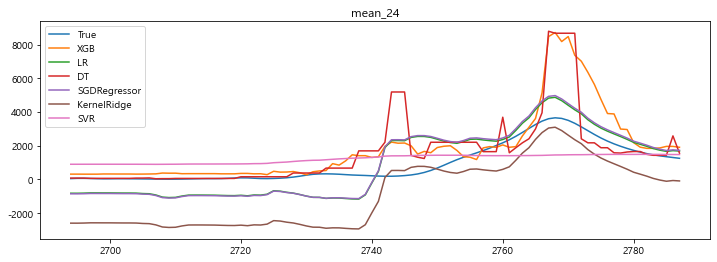

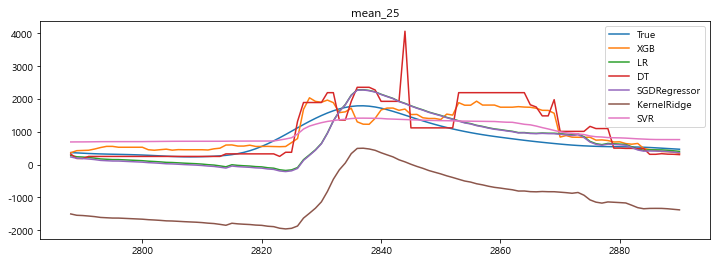

In [29]:
plot_hongsunum(predict_df, models, name)

# 한개의 로그 데이터

In [30]:
name = 'mean_log'
    
data_one_log = data_one.copy()

log_col = data_one_log.columns.difference(list(data_one_log.filter(regex="수위\(D지역\)").columns) + [y_col] + PK_col)
for col in log_col:
    data_one_log[col] = data_one_log[col].apply(lambda x : np.log(x - data_one_log[col].min() + 0.01))

In [31]:
model_predict(name, models, data_one_log, standard_scaler, predict_df, rmse_df)

XGB Start!
LR Start!
DT Start!
SGDRegressor Start!
KernelRidge Start!
SVR Start!


In [32]:
rmse_df

,XGB,LR,DT,SGDRegressor,KernelRidge,SVR
base,984.90,914.04,1122.25,969.83,2020.16,2124.38
log,985.69,1788.41,1120.20,2116.00,2765.48,2141.09
change,2212.18,1580.48,2175.15,1850.44,1866.78,2896.56
mean,1068.83,1104.97,1206.28,1098.66,2102.52,2122.82
mean_log,1069.78,2250.62,1205.92,2250.39,2913.27,2144.62


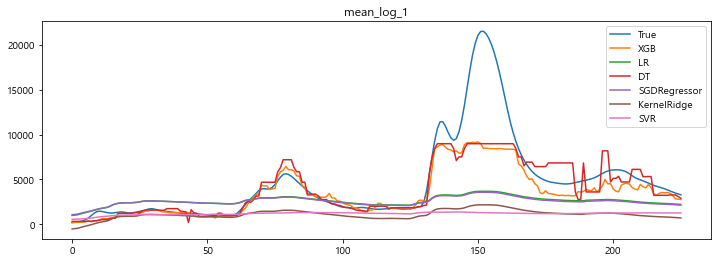

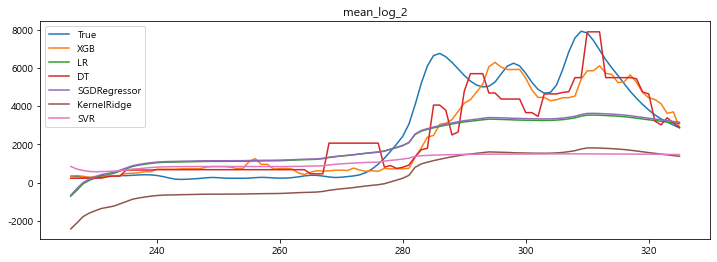

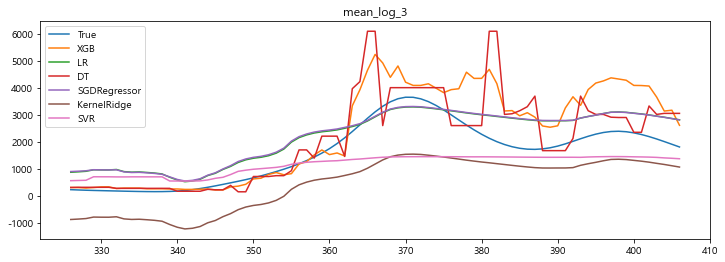

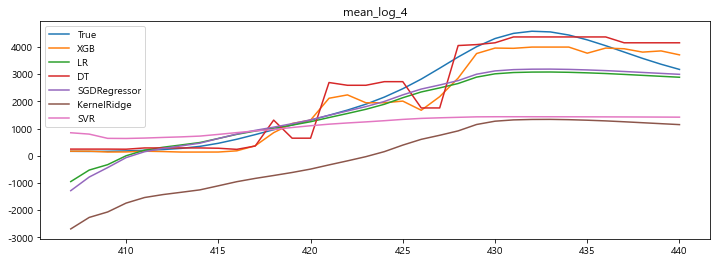

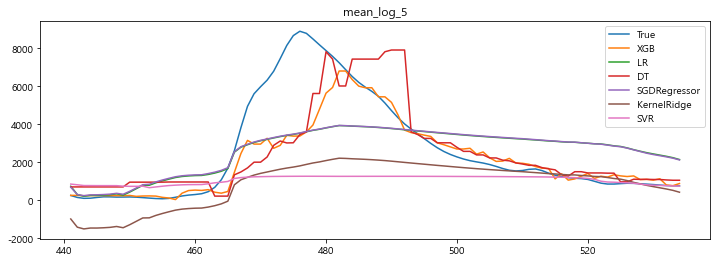

...

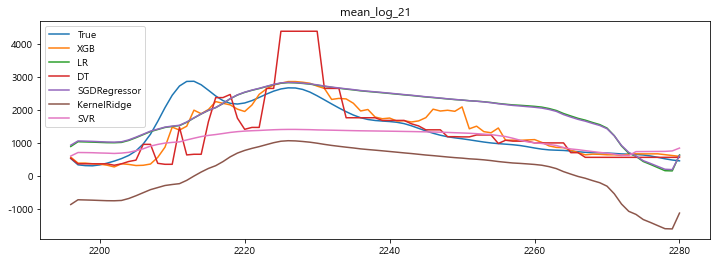

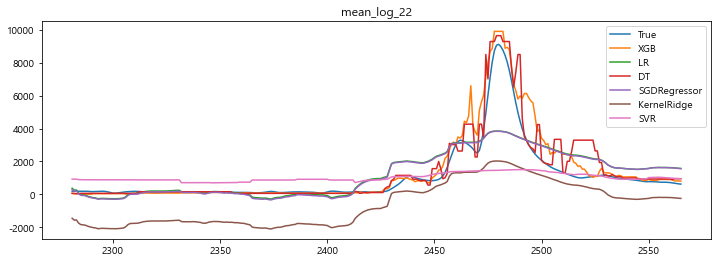

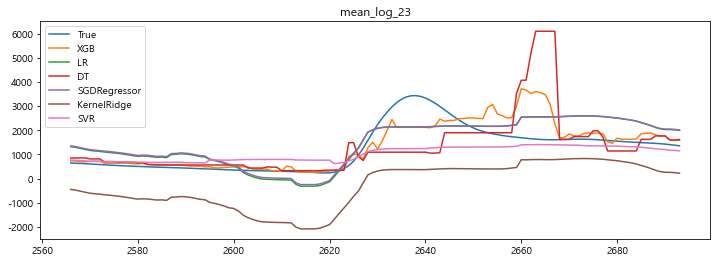

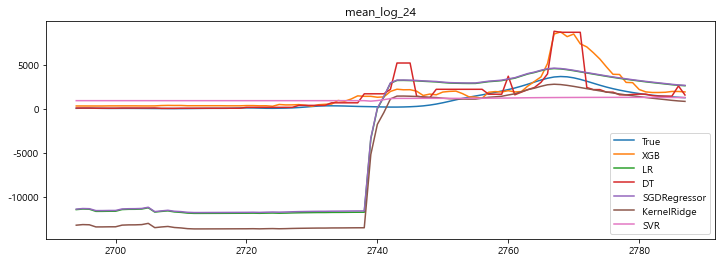

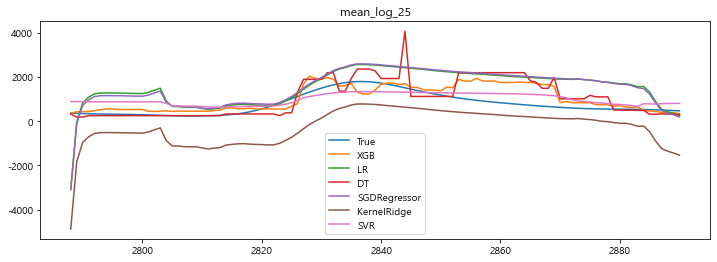

In [33]:
plot_hongsunum(predict_df, models, name)

# t-1데이터 사용

In [34]:
name = 'before y'
    
data_before = data_raw.copy()
data_before['유입량_shift'] = data_before['유입량'].shift()
data_before['홍수사상번호_shift'] = data_before['홍수사상번호'].shift()
data_before.loc[(data_before['홍수사상번호'] != data_before['홍수사상번호_shift']), '유입량_shift'] = np.nan
data_before = data_before.drop(columns=['홍수사상번호_shift'])

In [35]:
model_predict(name, models, data_before, standard_scaler, predict_df, rmse_df, option="shift_y")

XGB Start!
LR Start!
DT Start!
SGDRegressor Start!
KernelRidge Start!
SVR Start!


In [36]:
rmse_df

,XGB,LR,DT,SGDRegressor,KernelRidge,SVR
base,984.90,914.04,1122.25,969.83,2020.16,2124.38
log,985.69,1788.41,1120.20,2116.00,2765.48,2141.09
change,2212.18,1580.48,2175.15,1850.44,1866.78,2896.56
mean,1068.83,1104.97,1206.28,1098.66,2102.52,2122.82
mean_log,1069.78,2250.62,1205.92,2250.39,2913.27,2144.62
before y,3606.68,2844.80,3423.78,1456.10,47937.77,2122.02


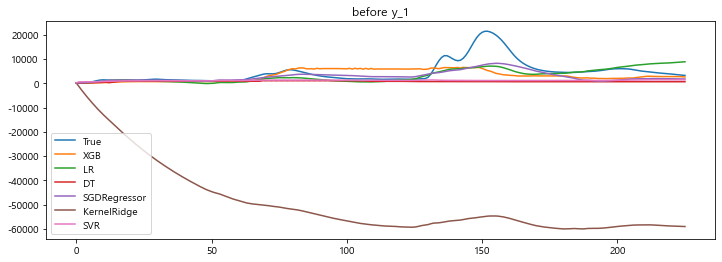

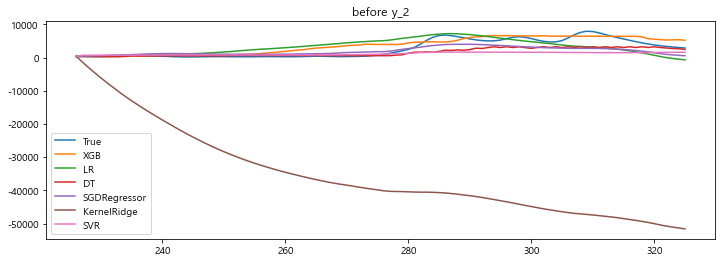

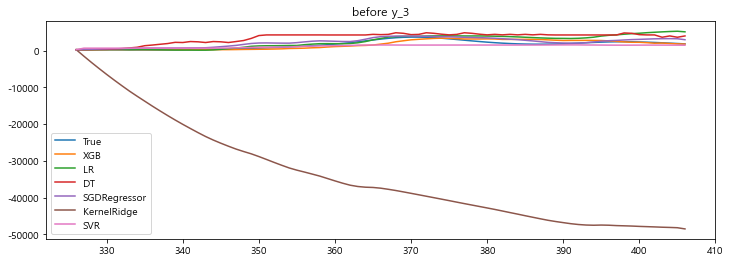

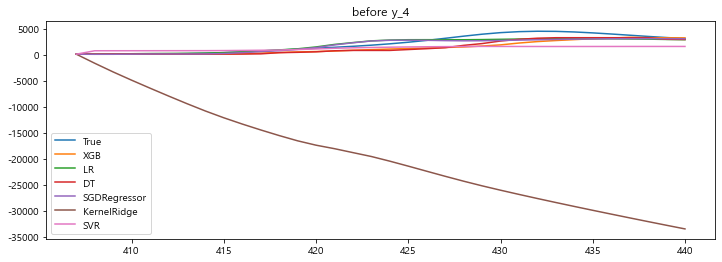

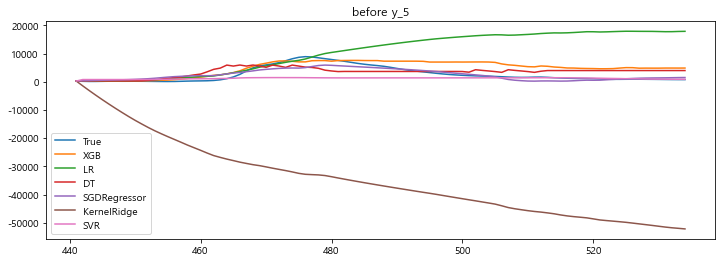

...

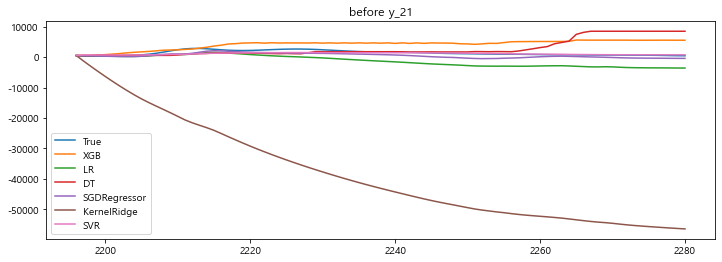

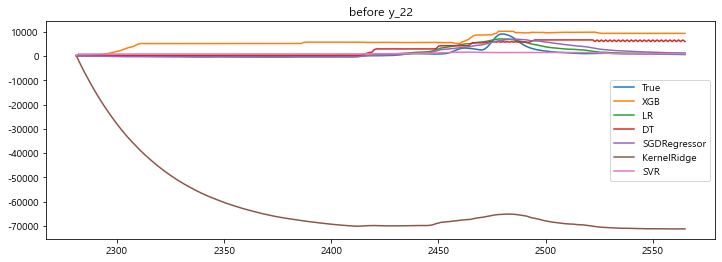

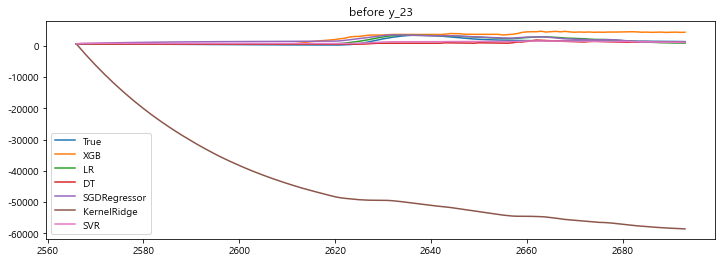

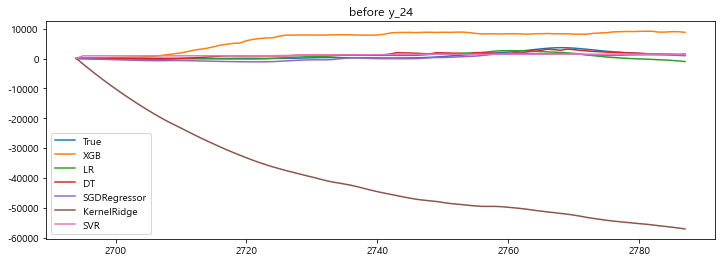

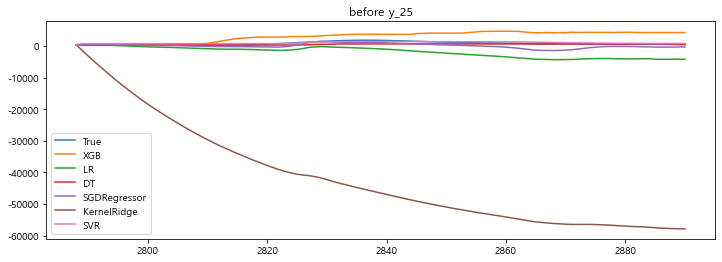

In [37]:
plot_hongsunum(predict_df, models, name)

# t-1 feature도 가져오기

In [38]:
name = 'before feature'

In [39]:
data_before_feture = data_one.copy()

for col in data_before_feture.columns.difference([y_col] + PK_col):
    data_before_feture[f'{col}_shift'] = data_before_feture[col].shift()

shift_col = data_before_feture.filter(regex='shift').columns
data_before_feture['홍수사상번호_shift'] = data_before_feture['홍수사상번호'].shift()

data_before_feture.loc[(data_before['홍수사상번호'] != data_before_feture['홍수사상번호_shift']), shift_col] = -999
data_before_feture = data_before_feture.drop(columns=['홍수사상번호_shift'])

In [40]:
model_predict(name, models, data_before_feture, standard_scaler, predict_df, rmse_df, option="shift")

XGB Start!
LR Start!
DT Start!
SGDRegressor Start!
KernelRidge Start!
SVR Start!


In [41]:
rmse_df

,XGB,LR,DT,SGDRegressor,KernelRidge,SVR
base,984.90,914.04,1122.25,969.83,2020.16,2124.38
log,985.69,1788.41,1120.20,2116.00,2765.48,2141.09
change,2212.18,1580.48,2175.15,1850.44,1866.78,2896.56
mean,1068.83,1104.97,1206.28,1098.66,2102.52,2122.82
mean_log,1069.78,2250.62,1205.92,2250.39,2913.27,2144.62
before y,3606.68,2844.80,3423.78,1456.10,47937.77,2122.02
before feature,1033.54,946.08,1114.64,1100.18,2035.73,2106.85


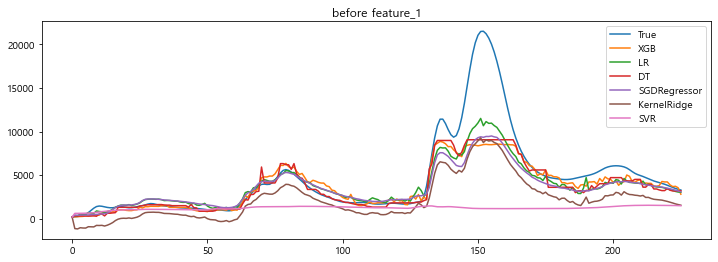

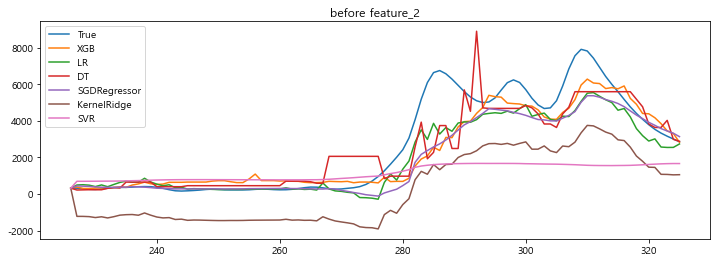

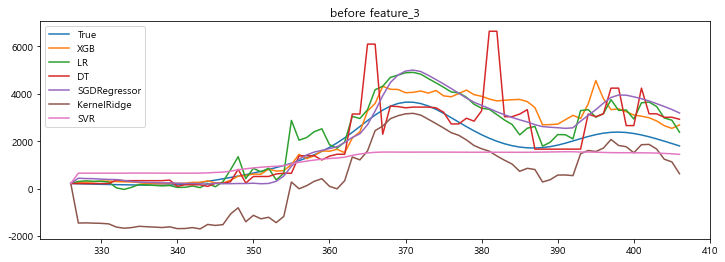

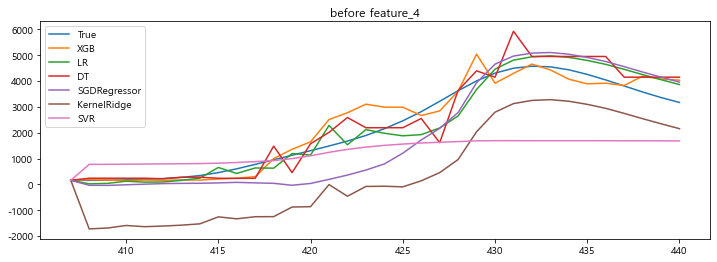

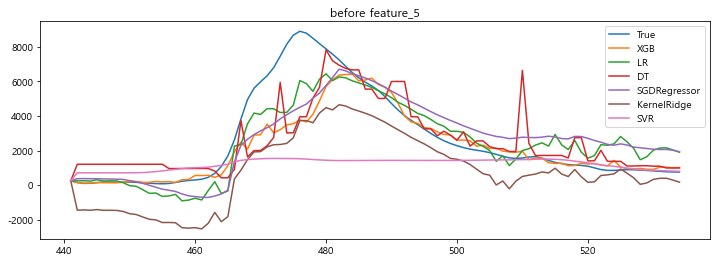

...

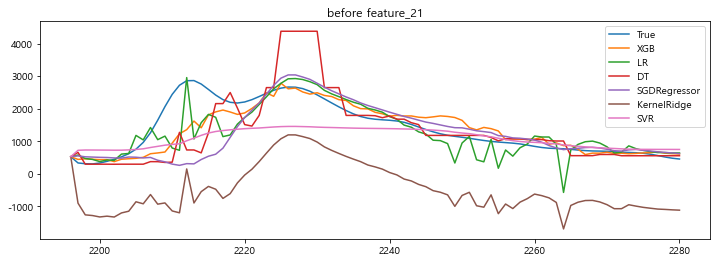

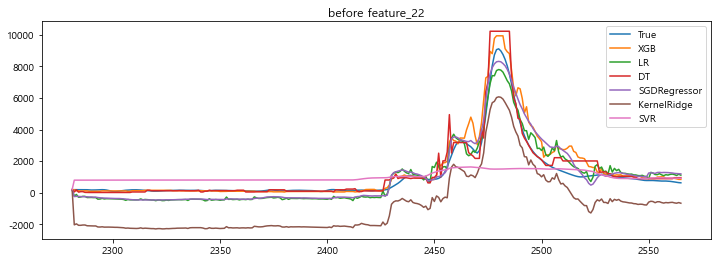

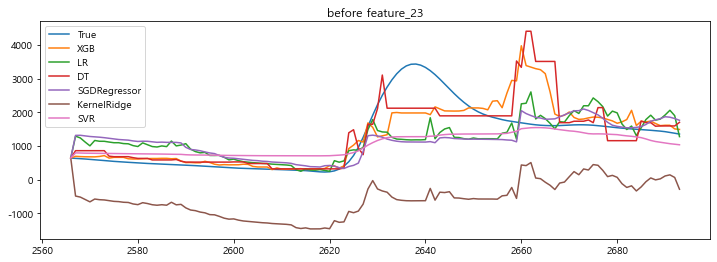

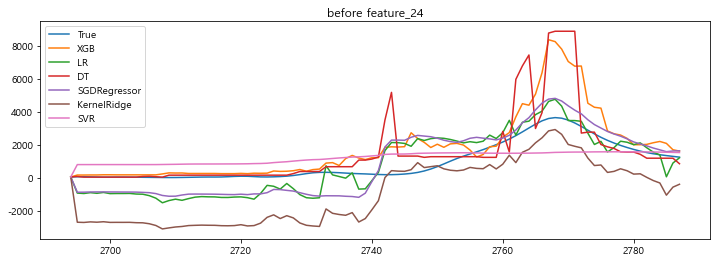

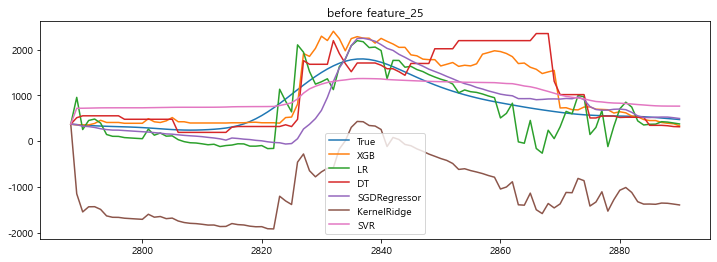

In [42]:
plot_hongsunum(predict_df, models, name)

# t-1 feature도 가져오기

In [12]:
name = 'before feature'

In [13]:
data_before_feture = data_raw.copy()

for col in data_before_feture.columns.difference([y_col] + PK_col):
    data_before_feture[f'{col}_shift'] = data_before_feture[col].shift()

shift_col = data_before_feture.filter(regex='shift').columns
data_before_feture['홍수사상번호_shift'] = data_before_feture['홍수사상번호'].shift()

data_before_feture.loc[(data_before['홍수사상번호'] != data_before_feture['홍수사상번호_shift']), shift_col] = -999
data_before_feture = data_before_feture.drop(columns=['홍수사상번호_shift'])

NameError: name 'data_before' is not defined

In [ ]:
model_predict(name, models, data_before_feture, standard_scaler, predict_df, rmse_df, option="shift")

In [41]:
rmse_df

,XGB,LR,DT,SGDRegressor,KernelRidge,SVR
base,984.90,914.04,1122.25,969.83,2020.16,2124.38
log,985.69,1788.41,1120.20,2116.00,2765.48,2141.09
change,2212.18,1580.48,2175.15,1850.44,1866.78,2896.56
mean,1068.83,1104.97,1206.28,1098.66,2102.52,2122.82
mean_log,1069.78,2250.62,1205.92,2250.39,2913.27,2144.62
before y,3606.68,2844.80,3423.78,1456.10,47937.77,2122.02
before feature,1033.54,946.08,1114.64,1100.18,2035.73,2106.85


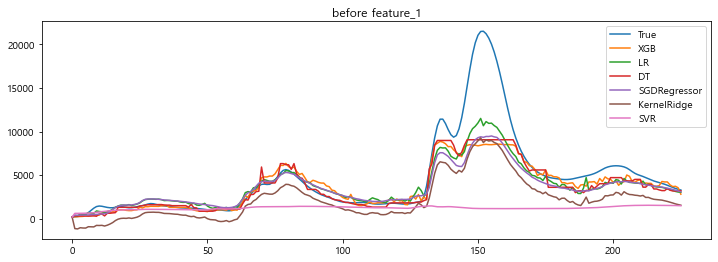

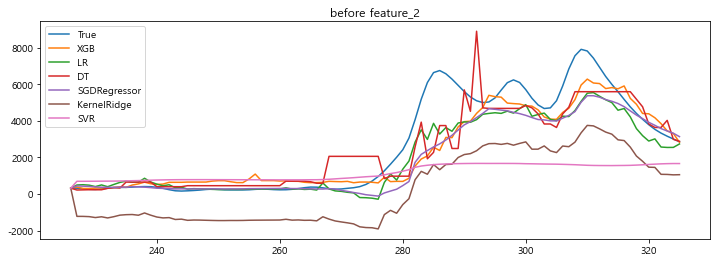

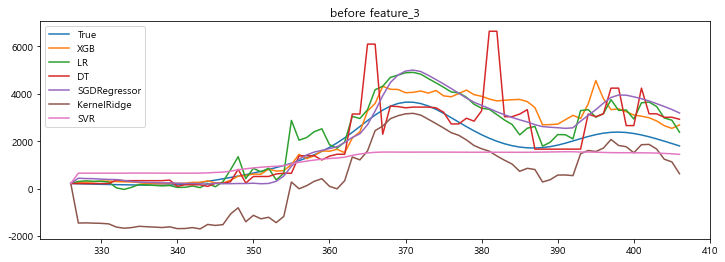

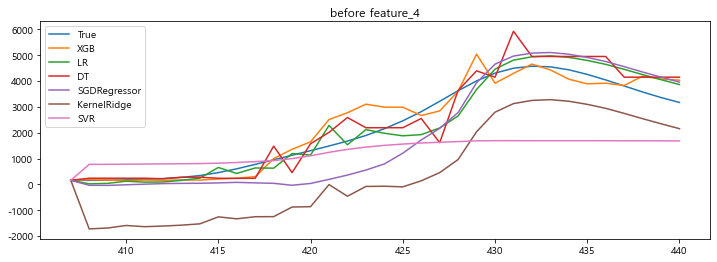

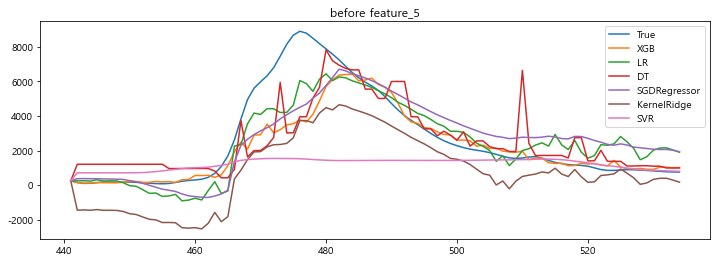

...

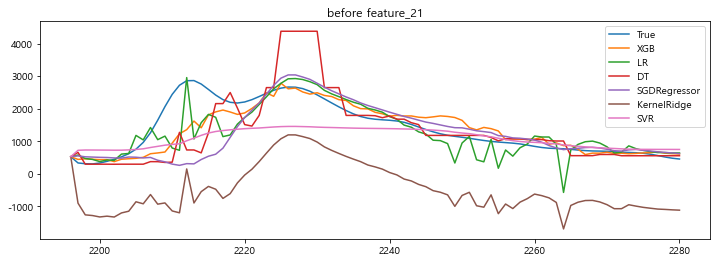

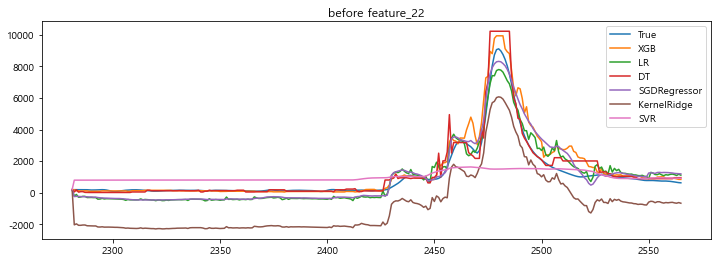

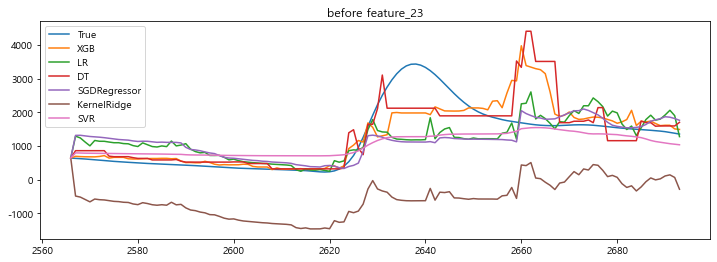

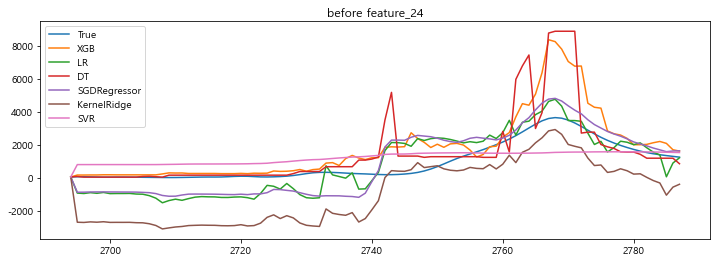

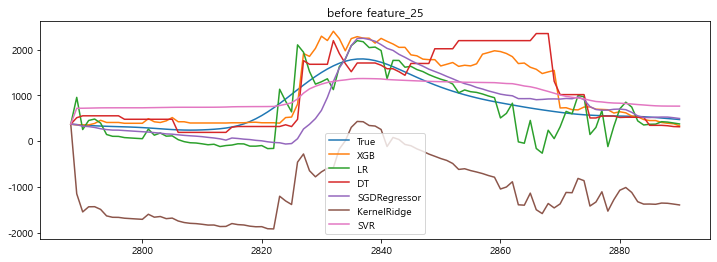

In [42]:
plot_hongsunum(predict_df, models, name)